## Prepare

In [39]:
import optuna
from optuna.trial import TrialState
import os
import pandas as pd
pd.options.mode.chained_assignment = None # avoids assignment warning
import numpy as np
import random
from glob import glob
from tqdm import tqdm
tqdm.pandas()  # enable progress bars in pandas operations
import gc
import cv2
import librosa
import sklearn
import json
import argparse

# Import for visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import librosa.display as lid
import IPython.display as ipd
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
# from kaggle_datasets import KaggleDatasets

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import transformers
from transformers import AutoFeatureExtractor
from transformers import ASTConfig
from torchvision import transforms
from torch.cuda.amp import autocast as autocast, GradScaler
from torch.optim import SGD, Adam, AdamW
from torch.optim.lr_scheduler import LambdaLR
import torch.nn.functional as F
from transformers.optimization import get_cosine_schedule_with_warmup
from sklearn.model_selection import StratifiedKFold

from optuna_utils.config import CFG
from optuna_utils.dataset import filter_data, upsample_data
# from optuna_utils.dataset import AudioDataset, ASTDataset, DataLoaderX, MusicnnDataset
from optuna_utils.dataset_pytorch import AudioDataset, ASTDataset, DataLoaderX, MusicnnDataset
from optuna_utils.models import BirdModel, ASTagModel, Musicnn, Efficient
from transformers import set_seed
from transformers import AutoConfig

In [40]:
parser = argparse.ArgumentParser(description='PyTorch Kaggle Bird Implementation')
parser.add_argument('--batch_size', type=int, default=10, metavar='N',
                    help='input batch size for training (default: 64)')
parser.add_argument('--lr', type=float, default=0.00001, metavar='LR',
                    help='learning rate (default: 0.0002)')
parser.add_argument('--max_epoch', type=int, default=25, metavar='N',
                    help='how many epochs')
parser.add_argument('--experiment_name', type=str, default='efficient_visual',
                    help='experiment name')
parser.add_argument('--n_trials', type=int, default=20,
                    help='number of trials')
parser.add_argument('--best_acc', type=float, default=0,
                    help='number of trials')
parser.add_argument('--model_name', type=str, default='efficient', choices=['beats', 'ast', 'musicnn', 'efficient'])
parser.add_argument('--eval_step', type=int, default=1)
parser.add_argument('--debug', action='store_true')
parser.add_argument('--model_path', type=str, default='experiments/ast/trial_0/ast.pth')
parser.add_argument('--fold', type=int, default=2)
args = parser.parse_args(['--best_acc', '0'])

In [41]:
set_seed(CFG.seed)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') 

In [42]:
def main(args, df):
    if args.model_name=='beats':
        dataset_train = AudioDataset(df, fold=args.fold, mode='train')
        # loader_train = DataLoader(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        loader_train = DataLoaderX(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = AudioDataset(df, fold=args.fold, mode='eval')
        # loader_eval = DataLoader(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        loader_eval = DataLoaderX(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        model = BirdModel(args)
        
    elif args.model_name=='ast':
        dataset_train = ASTDataset(df, fold=args.fold, mode='train')
        loader_train = DataLoader(dataset_train, batch_size=CFG.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = ASTDataset(df, fold=args.fold, mode='eval')
        loader_eval = DataLoader(dataset_eval, batch_size=CFG.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)

        config = AutoConfig.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")  
        model = ASTagModel.from_pretrained(
            "MIT/ast-finetuned-audioset-10-10-0.4593",
            config=config,
            train_config=args
        )
        
    elif args.model_name=='musicnn':
        dataset_train = MusicnnDataset(df, fold=args.fold, mode='train')
        loader_train = DataLoaderX(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = MusicnnDataset(df, fold=args.fold, mode='eval')
        loader_eval = DataLoaderX(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        model = Musicnn(args)
        
    elif args.model_name=='efficient':
        dataset_train = MusicnnDataset(df, fold=args.fold, mode='train')
        loader_train = DataLoaderX(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = MusicnnDataset(df, fold=args.fold, mode='eval')
        loader_eval = DataLoaderX(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        model = Efficient(args)
    else:
        raise ValueError('The model type - {} has not been implemented'.format(args.model_name))
    
    model = model.to(device)
    total_samples = dataset_train.__len__()
    num_warmup_steps = (total_samples // args.batch_size) * 2
    num_total_steps = (total_samples // args.batch_size) * args.max_epoch
    lr_scheduler = get_cosine_schedule_with_warmup(model.optimizer, num_warmup_steps=num_warmup_steps, num_training_steps=num_total_steps)

    best_metric = 0
    for epoch in tqdm(range(args.max_epoch)):
        model.train_step(loader_train, lr_scheduler)
        best_metric = model.eval_step(args, loader_eval, best_metric, epoch, model_name='{}.pth'.format(args.model_name))
    return best_metric

In [43]:
GCS_PATH = CFG.base_path
df = pd.read_csv(f'{CFG.base_path}/train_metadata.csv')
df['filepath'] = GCS_PATH + '/train_audio/' + df.filename
df['target'] = df.primary_label.map(CFG.name2label)

f_df = filter_data(df, thr=5)
# f_df.cv.value_counts().plot.bar(legend=True)
up_df = upsample_data(df, thr=50)

CFG.class_weights = up_df.primary_label.value_counts()[:].to_numpy()

# Initialize the StratifiedKFold object with 5 splits and shuffle the data
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=CFG.seed)

# Reset the index of the dataframe
df = df.reset_index(drop=True)

# Create a new column in the dataframe to store the fold number for each row
df["fold"] = -1

# Iterate over the folds and assign the corresponding fold number to each row in the dataframe
for fold, (train_idx, val_idx) in enumerate(skf.split(df, df['primary_label'])):
    df.loc[val_idx, 'fold'] = fold

/home/plathzheng/miniconda3/envs/tutorial/lib/python3.8/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


## Data Analyze and Visualization

### Utility

In [16]:
def load_audio(filepath):
    audio, sr = librosa.load(filepath)
    return audio, sr

def show_image(filename):
    img = cv2.imread(f'/kaggle/input/birdclef23-image-dataset/{filename}.jpg')
    img = img[...,::-1] # bgr => rgb
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('OFF')
    plt.show()
    return img

def get_spectrogram(audio):
    spec = librosa.feature.melspectrogram(y=audio, sr=CFG.sample_rate, 
                                   n_mels=CFG.img_size[0],
                                   n_fft=CFG.nfft,
                                   hop_length=CFG.hop_length,
                                   fmax=CFG.fmax,
                                   fmin=CFG.fmin,
                                   )
    spec = librosa.power_to_db(spec, ref=np.max)
    return spec

def display_audio(row):
    # Caption for viz
    caption = f'Id: {row.filename} | Name: {row.common_name} | Sci.Name: {row.scientific_name} | Rating: {row.rating}'
    # Read audio file
    audio, sr = load_audio(row.filepath)
    # Keep fixed length audio
    audio = audio[:CFG.audio_len]
    # Spectrogram from audio
    spec = get_spectrogram(audio)
    # Display audio
    print("# Audio:")
    display(ipd.Audio(audio, rate=CFG.sample_rate))
    # print("# Image:")
    show_image(row.common_name)
    print('# Visualization:')
    fig, ax = plt.subplots(2, 1, figsize=(12, 2*3), sharex=True, tight_layout=True)
    fig.suptitle(caption)
    # Waveplot
    lid.waveshow(audio,
                 sr=CFG.sample_rate,
                 ax=ax[0])
    # Specplot
    lid.specshow(spec, 
                 sr = CFG.sample_rate, 
                 hop_length = CFG.hop_length,
                 n_fft=CFG.nfft,
                 fmin=CFG.fmin,
                 fmax=CFG.fmax,
                 x_axis = 'time', 
                 y_axis = 'mel',
                 cmap = 'coolwarm',
                 ax=ax[1])
    ax[0].set_xlabel('')
    fig.show()

### Check

We see initially that the three classes with the highest number of categories are 'barswa', 'wlwwar', 'thrnig1',, and the three classes with the lowest number are 'whhsaw1', 'afpkin1', 'crefra2'.

We also show the original wav figure and the corresponding spectrogram figure

['barswa', 'wlwwar', 'thrnig1', 'whhsaw1', 'afpkin1', 'crefra2']
# Category: barswa
# Num Samples: 500
# Audio:


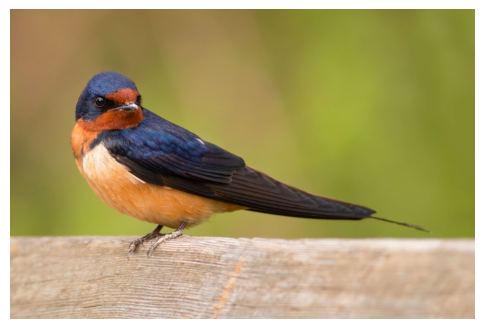

# Visualization:


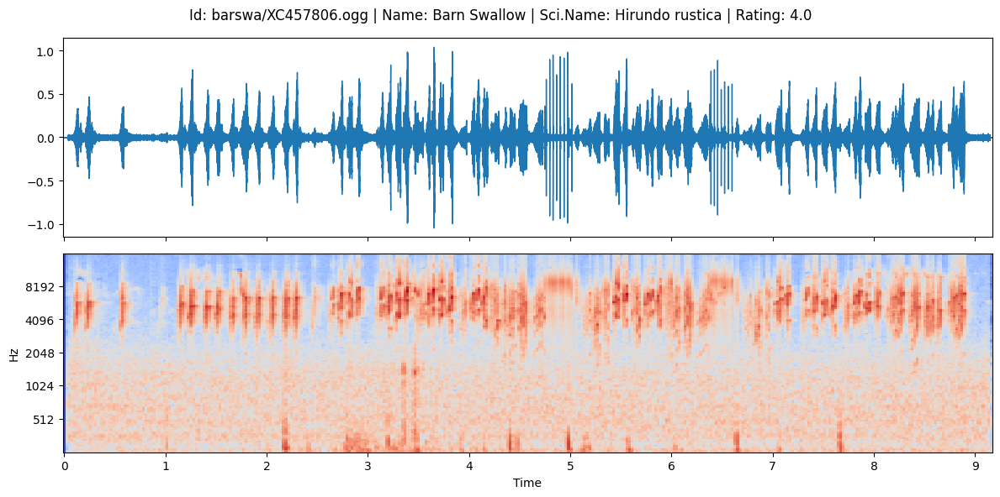

In [18]:
stat = df.primary_label.value_counts().index.tolist()
class_names = stat[:3] + stat[-3:] # popular + not popular
print(class_names)

class_name = class_names[0]
print(f'# Category: {class_name}')
class_df = df.query("primary_label==@class_name")
print(f'# Num Samples: {len(class_df)}')
row = class_df.sample(1).squeeze()

# Display audio
display_audio(row)

### The overview of all data

In [9]:
data = pd.read_csv("/kaggle/input/birdclef-2023/train_metadata.csv",engine='python')
data.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg


In [10]:
print(df.primary_label.value_counts()[:])

barswa     500
wlwwar     500
thrnig1    500
eaywag1    500
comsan     500
          ... 
lotcor1      1
whctur2      1
whhsaw1      1
afpkin1      1
crefra2      1
Name: primary_label, Length: 264, dtype: int64


We can see, the number of categories is 264. In the same category, the largest sample size is 500, the smallest sample size is only 1. Therefore, there exits the Long Tail Problem.

<AxesSubplot: >

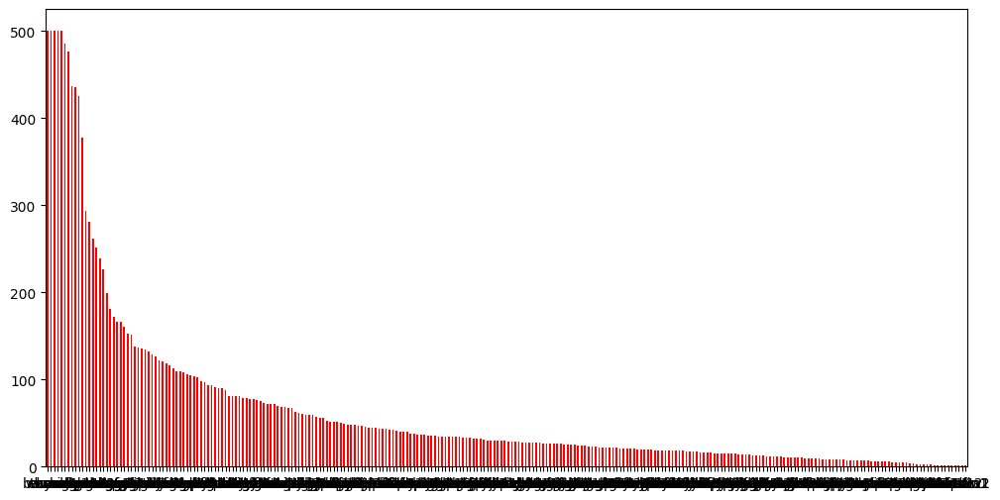

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.set_xticks([])
df.primary_label.value_counts()[:].plot.bar(color='red', label='w/o upsample')

In [13]:
datagroup = df.groupby("primary_label").count()
datagroup

,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,filepath,target,cv,fold
primary_label,,,,,,,,,,,,,,,
abethr1,15,15,14,14,15,15,15,15,15,15,15,15,15,15,15
abhori1,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126
abythr1,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28
afbfly1,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18
afdfly1,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yertin1,134,134,133,133,134,134,134,134,134,134,134,134,134,134,134
yesbar1,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29
yespet1,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15


### Visualization

#### Bird Distribution

In [32]:
latitude = df.latitude.values
longitude = df.longitude.values
cate = df.primary_label.values

cate = np.array(cate)
cate = cate[np.isfinite(latitude)]

latitude = np.array(latitude)
latitude = latitude[np.isfinite(latitude)]

longitude = np.array(longitude)
longitude = longitude[np.isfinite(longitude)]

print(latitude.mean(), latitude.std())
print(longitude.mean(), longitude.std())

12.599897051692794 29.207380501753587
22.03568991172192 28.742522386815295


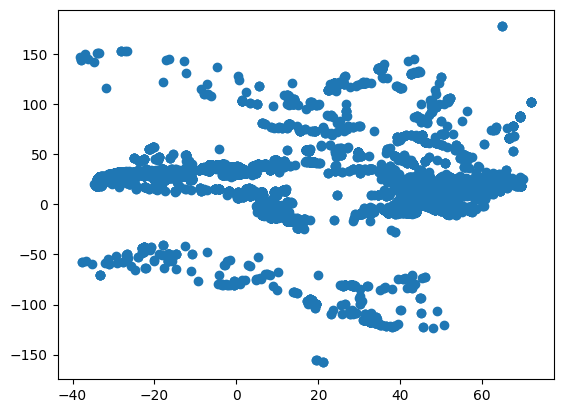

In [35]:

plt.scatter(latitude, longitude, )

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

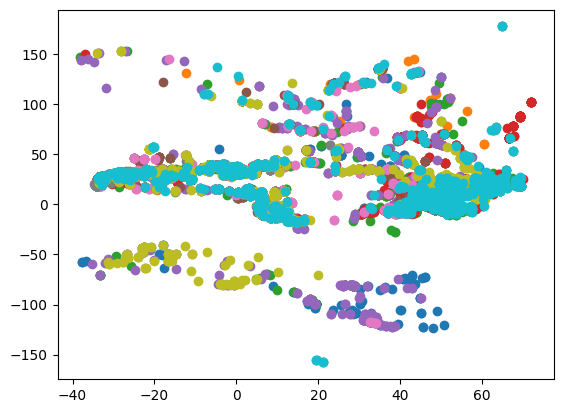

In [38]:
categories = np.unique(cate)
data = np.random.randn(len(categories), 2)

# 生成颜色列表
colors = plt.cm.tab10(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    lon = longitude[cate==category]
    lat = latitude[cate==category]
    plt.scatter(lat, lon, c=colors[i], label=category)

We can see the bird distribution based on longitude and latitude. 

## Machine Learning

## Deep Learning

In this part, we introduce four deep learning models to classify the bird class. They respectively are:

1. [BEATs](https://github.com/microsoft/unilm/tree/master/beats)： an iterative audio pre-training framework to learn Bidirectional Encoder representation from Audio Transformers

2. [Musicnn](https://github.com/jordipons/musicnn)： `musicnn` is based on convolutional neural network and is designed to solve music tagging task;

3. [Audio Spectrogram Transformer](https://huggingface.co/docs/transformers/model_doc/audio-spectrogram-transformer) (AST)： The Audio Spectrogram Transformer applies a [Vision Transformer](https://huggingface.co/docs/transformers/model_doc/vit) to audio, by turning audio into an image (spectrogram). The model obtains state-of-the-art results for audio classification.

4. [Efficientnet](https://arxiv.org/abs/1905.11946)：a convolutional neural network architecture and scaling method that uniformly scales all dimensions of depth/width/resolution using a compound coefficient.

5. [Wav2Vec](https://huggingface.co/docs/transformers/model_doc/wav2vec2): it is a pretrain model which can be used to learn speech representations.



### Model Architecture

Then, We introduce the architecture used in this project.

The BEATs Architecture is shown in the following figure 

![figure](https://media.arxiv-vanity.com/render-output/7418472/Arc.png)

The Audio Spectrogram Transformer Architecture is shown in the following figure

 ![figure](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/model_doc/audio_spectogram_transformer_architecture.png)



The Musicnn Architecture is shown in the following figure:![figure](https://github.com/jordipons/musicnn/blob/master/images/musicnn.png?raw=true)

The Efficientnet Architecture is shown in the following figure: ![figure](https://1.bp.blogspot.com/-DjZT_TLYZok/XO3BYqpxCJI/AAAAAAAAEKM/BvV53klXaTUuQHCkOXZZGywRMdU9v9T_wCLcBGAs/s1600/image2.png)

The Wav2Vec Architecture is shown in the following figure: ![figure](https://aisholar.s3.ap-northeast-1.amazonaws.com/media/November2020/%E3%82%B9%E3%82%AF%E3%83%AA%E3%83%BC%E3%83%B3%E3%82%B7%E3%83%A7%E3%83%83%E3%83%88_2020-11-30_11.52.39-min.png)

Among them, BEATs and AST use the transformer as the base block in their model, while Musicnn and Efficientnet use convolutional neural network as their base block in their model. 

As we all know, the convolutional neural network has a powerful ability to extract features from figure data. When we translate audio wav data into mel spectrogram data, it has a similar characteristic compared with traditional figure data. Therefore, we first consider three model based on convolutional neural network (Musicnn, Efficientnet and Wav2Vec). Among them, Musicnn is designed to solve music tag task and it takes into account the features of both time direction and frequency direction, the efficientnet shows satisfactory performance for computer vision tasks and its small number of model parameters is suitable for application scenarios with limited inference time, while the wav2vec is a model pre-trained on a large data set with excellent feature extraction capability. 

Furthermore, since vision transformer has recently shown remarkable performance in visual tasks, we also considered two models (BEATs and AST) based on the transformer architecture


### Feature used for each model

AST, Musicnn and Efficientnet use the MFCC as their features which is shown in the aforementioned part. While for BEATs, it has a special feature extraction methods, we here show its feature in the following fiture:

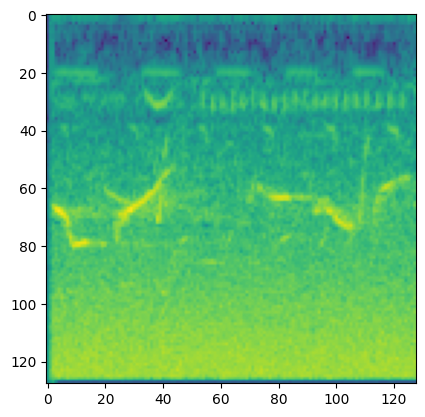

In [13]:
import torchaudio.compliance.kaldi as ta_kaldi
import torchaudio

def preprocess(
    source: torch.Tensor,
    fbank_mean: float = 13.42948,
    fbank_std: float = 3.960432,
    sample_frequency: int = 16000,
) -> torch.Tensor:
    fbanks = []
    for waveform in source:
        waveform = waveform.unsqueeze(0) * 2**15
        fbank = ta_kaldi.fbank(
            waveform,
            num_mel_bins=128,
            sample_frequency=sample_frequency,
            frame_length=25,
            frame_shift=10,
        )
        fbanks.append(fbank)
    fbank = torch.stack(fbanks, dim=0)
    fbank = (fbank - fbank_mean) / (2 * fbank_std)
    return fbank

audio_path = df.filepath.values[0]
wav = torchaudio.load(audio_path)[0]
res = preprocess(wav, sample_frequency=32000)
plt.imshow(res[0].transpose(1, 0)[:128, :128].cpu().numpy())

### Data Augmentation

We show multiple augmentation methods, such as random resized crop, polarity inversion, add noise, gain, high low pass, delay, pitchshift and reverb. These methods are implemented by torchaudio_augmentations. We show the augmention audio in the following figure: 

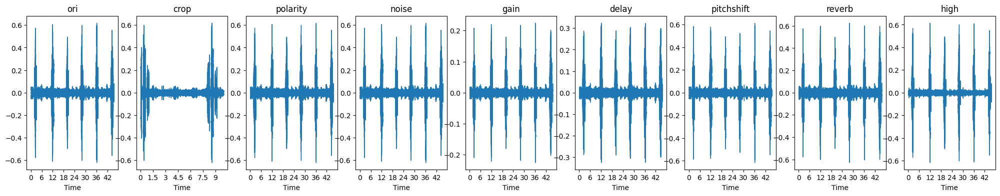

In [19]:
from torchaudio_augmentations import *
import librosa.display as lid

def audio_augmentation(audio_data : torch.Tensor, sr: int, 
                       num_augmented_sampels=4,
                       num_samples=16000,
                       polarity_p=0.8, 
                       min_snr=0.001, 
                       max_snr=0.005, 
                       noise_p=0.3, 
                       gain_p=0.2, 
                       delay_p=0.5, 
                       shift_p=0.4, 
                       reverb_p=0.3):
    if num_samples>max(audio_data.shape):
        num_samples = max(audio_data.shape)
    
    transforms = [
                RandomResizedCrop(n_samples=num_samples),
                RandomApply([PolarityInversion()], p=polarity_p),
                RandomApply([Noise(min_snr=min_snr, max_snr=max_snr)], p=noise_p),
                RandomApply([Gain()], p=gain_p),
                HighLowPass(sample_rate=sr), # this augmentation will always be applied in this aumgentation chain!
                RandomApply([Delay(sample_rate=sr)], p=delay_p),
                RandomApply([PitchShift(
                    n_samples=num_samples,
                    sample_rate=sr
                )], p=shift_p),
                RandomApply([Reverb(sample_rate=sr)], p=reverb_p)]   
    transforms = ComposeMany(transforms=transforms, num_augmented_samples=num_augmented_sampels)
    audio_aug = transforms(audio_data)
    return audio_aug

audio_path = df.filepath.values[0]
wav, sr = torchaudio.load(audio_path)
wav_resize = RandomResizedCrop(n_samples=CFG.sample_rate * CFG.time_length)(wav)
wav_polar = PolarityInversion()(wav)
wav_noise = Noise()(wav)
wav_gain = Gain()(wav)
wav_delay = Delay(sample_rate=32000)(wav)
wav_pitchshift = PitchShift(n_samples=CFG.sample_rate * CFG.time_length, sample_rate=32000)(wav)
wav_reverb = Reverb(sample_rate=32000)(wav)
wav_high = HighLowPass(sample_rate=sr)(wav)
fig, axs = plt.subplots(1, 9, figsize=(25, 4))
lid.waveshow(wav.numpy(), sr=sr, ax=axs[0])
axs[0].set_title('ori')
lid.waveshow(wav_resize.numpy(), sr=sr, ax=axs[1])
axs[1].set_title('crop')
lid.waveshow(wav_polar.numpy(), sr=sr, ax=axs[2])
axs[2].set_title('polarity')
lid.waveshow(wav_noise.numpy(), sr=sr, ax=axs[3])
axs[3].set_title('noise')
lid.waveshow(wav_gain.numpy(), sr=sr, ax=axs[4])
axs[4].set_title('gain')
lid.waveshow(wav_delay.numpy(), sr=sr, ax=axs[5])
axs[5].set_title('delay')
lid.waveshow(wav_pitchshift.numpy(), sr=sr, ax=axs[6])
axs[6].set_title('pitchshift')
lid.waveshow(wav_reverb.numpy(), sr=sr, ax=axs[7])
axs[7].set_title('reverb')
lid.waveshow(wav_high.numpy(), sr=sr, ax=axs[8])
axs[8].set_title('high')
plt.show()

we present the original audio and noise audio:


In [20]:
ipd.Audio(wav, rate=CFG.sample_rate)

In [21]:
ipd.Audio(wav_noise, rate=CFG.sample_rate)

### Optimization Objective

Through count the sample number in each class, we know that there exits the classic "Long Tail" problem. 

<AxesSubplot: >

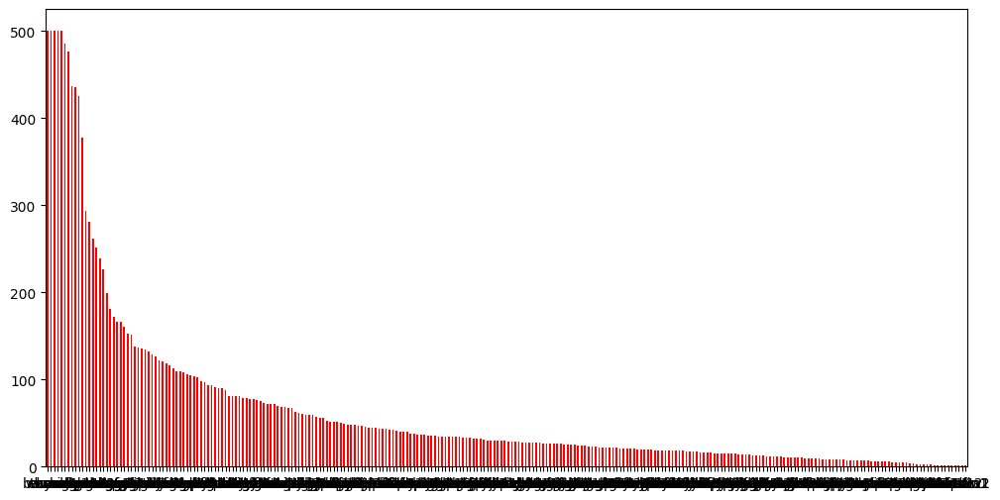

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.set_xticks([])
df.primary_label.value_counts()[:].plot.bar(color='red', label='w/o upsample')


Therefore, in addition to the traditional loss fucntion BCE and CCE, we also use focal loss which has a potential to solve the Long Tail problem.

1. Binary Cross Entropy:

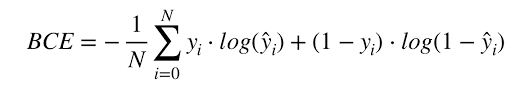


2. Category Cross Entropy:

![figure](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSjxZbrNsvsxfQ3rfB9Eh8dD6-wmOizbwLuOw&usqp=CAU)

3. Focal Loss:

![figure](https://miro.medium.com/v2/resize:fit:640/format:webp/1*zkWsCJPPtCKzkG1VdZ4atA.png)


### Evaluation and Measurement

For evaluation the model performance in training process, we use multi fold cross evaluation method. Specifically, we use the sklearn.model_selection.StratifiedKFold to split the df into 5 fold. Then, in the training process, we will use different fold to evaluate the model performance. The data split code is shown in the following cell:

In [32]:
# Initialize the StratifiedKFold object with 5 splits and shuffle the data
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=CFG.seed)

# Reset the index of the dataframe
df = df.reset_index(drop=True)

# Create a new column in the dataframe to store the fold number for each row
df["fold"] = -1

# Iterate over the folds and assign the corresponding fold number to each row in the dataframe
for fold, (train_idx, val_idx) in enumerate(skf.split(df, df['primary_label'])):
    df.loc[val_idx, 'fold'] = fold
df.head()

/home/plathzheng/miniconda3/envs/tutorial/lib/python3.8/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,filepath,target,cv,fold
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,3
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,3
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,0
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,4
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,1


We choose average precision score and auc to measure the model performance

In [ ]:
def measurement(y_true, y_pred, padding_factor=5):
    if not CFG.loss=='BCE':
        y_true = F.one_hot(torch.from_numpy(y_true), num_classes=CFG.num_classes).numpy()
    # y_true = y_true.numpy()
    num_classes = y_true.shape[1]
    pad_rows = np.array([[1]*num_classes]*padding_factor)
    y_true = np.concatenate([y_true, pad_rows])
    y_pred = np.concatenate([y_pred, pad_rows])
    score = sklearn.metrics.average_precision_score(y_true, y_pred, average='macro',)
    roc_aucs = sklearn.metrics.roc_auc_score(y_true, y_pred, average='macro')
    return score, roc_aucs

### Model Training

In each fold, we will tune the learning rate and batch size. We use optuna to help us do this.

In [ ]:
def objective(trial):
    args.lr = trial.suggest_float("lr", 1e-4, 1e-3, log=True)
    args.batch_size = trial.suggest_int('batch size', 32, 32) if not CFG.debug else 4
    args.fold = trial.suggest_int('split fold', 0, 4)
    CFG.batch_size = args.batch_size
    CFG.lr = args.lr
    
    args.save_dir = os.path.join(experiment_dir, "trial_{}".format(trial.number))
    os.makedirs(args.save_dir, exist_ok=True)
    
    for key, value in trial.params.items():
        print("  {}: {} \n".format(key, value))
    best_metric = main(args)
    
    with open(os.path.join(args.save_dir, "best_metric.txt"), mode='w', encoding='utf-8') as w:
        for key, value in trial.params.items():
            w.writelines("    {}: {} \n".format(key, value))
        w.writelines(str(best_metric))
    return best_metric

assign the experiment root, model_name

In [ ]:
args.experiment_name = 'efficient_visual'
args.model_name = 'efficient'

experiment_dir = os.path.join("experiments", args.experiment_name)
os.makedirs(experiment_dir, exist_ok=False)

#### Train Model by Optuna

In [ ]:
experiment_dir = os.path.join("experiments", args.experiment_name)
os.makedirs(experiment_dir, exist_ok=False)
study = optuna.create_study(directions=['maximize'])
study.optimize(objective, n_trials=10)
pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])
print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

#### Parameter Importance

#### Optimization history

### Experiment analyze

#### OverView

|                         | BEATs | Musicnn | EfficientNet | AST  |
| :---------------------: | :---: | :-----: | :----------: | :--: |
| Average Precision Score | 0.62  |  0.48   |     0.66     | 0.87 |
|           AUC           | 0.87  |  0.75   |     0.92     | 0.98 |


We can see that the AST model has the best performance, followed by EfficientNet, while Musicnn and BEATs show poor performance. Because AST is pre-trained on a large-scale data set, and it uses a structure similar to ViT to extract discriminable features from spectrogram, it still has excellent performance despite using bird audio with a lot of noise. The efficientnet, however, enables the extraction of features of multiple scales using convolution and the discovery of subtle differences in the spectrogram, thus achieving certain recognition accuracy. However, we can see that the AUC and APS of the model are quite different, which may require us to adjust the classification threshold in the subsequent training, so as to further improve the performance of the model.

#### Error Analyze

From, the above training part, we know that AST and Efficientnet achieve a better performance than that of other models. In the following part, we will focus on these two models and analyze why they have a better performance and whether there is room for improvement.

In [ ]:
config = ASTConfig() 
ast_model = ASTagModel(config=config, train_config=args)
ckpt = torch.load('experiments/ast_9layer/trial_1/ast.pth', map_location=device)
ast_model.load_state_dict(state_dict=ckpt)
ast_model = ast_model.to(device)
ast_model.eval()


eff_model = Efficient(args)
eff_model = torch.load('experiments/efficient_save/trial_0/efficient.pth', map_location=device)
eff_model = eff_model.to(device)
eff_model.eval()
# ckpt = torch.load('experiments/efficient_save/trial_0/efficient.pth')
# efficient_model.load_state_dict(state_dict=ckpt)

In [98]:
class ASTDatasetShow(ASTDataset):
    def __init__(self, df, fold=4, mode='train', transform=None):
        super().__init__(df, fold, mode, transform)
    
    def __getitem__(self, idx):
        audio, label = super().__getitem__(idx)
        audio_path = self.train_paths[idx] if self.mode=='train' else self.valid_paths[idx]
        return audio, label, audio_path

class MusicnnDatasetShow(MusicnnDataset):
    def __init__(self, df, fold=4, mode='train', transform=None):
        super().__init__(df, fold, mode, transform)
    
    def __getitem__(self, idx):
        audio, label = super().__getitem__(idx)
        audio_path = self.train_paths[idx] if self.mode=='train' else self.valid_paths[idx]
        return audio, label, audio_path
dataset_eval_ast = ASTDatasetShow(df, fold=4, mode='eval')
loader_ast = DataLoader(dataset_eval_ast, batch_size=1, shuffle=False, num_workers=0)
dataset_eval = MusicnnDatasetShow(df, fold=2, mode='eval')
ast_valid_paths = dataset_eval_ast.valid_paths
ast_valid_paths = [path.replace('.pt', '_mfcc.npy') for path in ast_valid_paths]
dataset_eval.valid_paths = ast_valid_paths
loader_eff = DataLoaderX(dataset_eval, batch_size=1, shuffle=False, num_workers=0)

pred_ast = []
pred_eff = []
labels = []
paths = []
cnt = 10

for index, (audio, label, path) in enumerate(loader_ast):
    audio = audio.to(device)
    with torch.no_grad():
        pred = ast_model(audio)
        pred_ast.append(pred.cpu().numpy())
        labels.append(label)
        paths.append(path)
    if index>10:
        break

for index, (audio, label, path) in enumerate(loader_eff):
    audio = audio.to(device)
    with torch.no_grad():
        pred = eff_model(audio)
        pred_eff.append(pred.cpu().numpy())
    if index>10:
        break

predast = [CFG.label2name[np.argmax(pred)] for pred in pred_ast]
predeff = [CFG.label2name[np.argmax(pred)] for pred in pred_eff]
label = [path[0].split('/')[-2] for path in paths]
print("AST pred: ", predast)
print("EFF pred: ", predeff)
print("GT  Pred: ", label)

AST pred:  ['woosan', 'ratcis1', 'abethr1', 'abhori1', 'abhori1', 'abhori1', 'wbrcha2', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1']
EFF pred:  ['woosan', 'abethr1', 'comsan', 'rewsta1', 'abhori1', 'hoopoe', 'abhori1', 'abhori1', 'comsan', 'abhori1', 'abhori1', 'abhori1']
GT  Pred:  ['abethr1', 'abethr1', 'abethr1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1']


We compare the prediction results of the ast model and the efficientnet model in the validation set. 

We can see that the ast model has a better performance than the efficientnet model.

We'll look in depth where the model's predictions are wrong.

We respectively show the samples where both models predict wrong, and the samples where a single model predicts wrong.

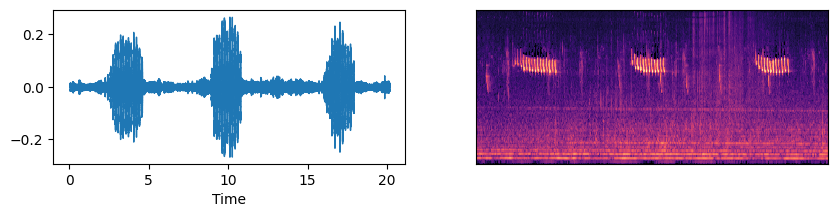

In [94]:
common_error_path = paths[0][0]
wav, sr = librosa.load(common_error_path.replace('.pt', '.ogg'))
spec = librosa.feature.melspectrogram(y=wav, sr=CFG.sample_rate, 
                                n_mels=CFG.img_size[0],
                                n_fft=CFG.nfft,
                                hop_length=CFG.hop_length,
                                fmax=CFG.fmax,
                                fmin=CFG.fmin,
                                )
spec = librosa.power_to_db(spec, ref=np.max)
fig, axs = plt.subplots(1, 2, figsize=(10, 2))
lid.waveshow(wav, sr=CFG.sample_rate, ax=axs[0])
lid.specshow(spec, sr=CFG.sample_rate, ax=axs[1])
display(ipd.Audio(wav, rate=CFG.sample_rate))

We show the original audio wav and the corresponding spectrogram. The original audio is also presented. From the original audio, we can hear that there is a loud noise. The bird's calls have certain regularity. And there may be other bird calls in the background as well which makes it difficult for the model to identify the right bird.

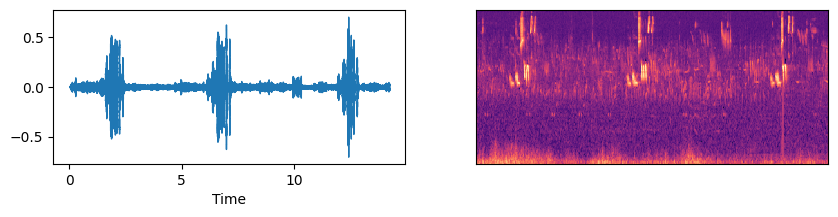

In [96]:
ast_error_path = paths[1][0]
wav, sr = librosa.load(ast_error_path.replace('.pt', '.ogg'))
spec = librosa.feature.melspectrogram(y=wav, sr=CFG.sample_rate, 
                                n_mels=CFG.img_size[0],
                                n_fft=CFG.nfft,
                                hop_length=CFG.hop_length,
                                fmax=CFG.fmax,
                                fmin=CFG.fmin,
                                )
spec = librosa.power_to_db(spec, ref=np.max)
fig, axs = plt.subplots(1, 2, figsize=(10, 2))
lid.waveshow(wav, sr=CFG.sample_rate, ax=axs[0])
lid.specshow(spec, sr=CFG.sample_rate, ax=axs[1])
display(ipd.Audio(wav, rate=CFG.sample_rate))

For this sample, AST model has a correct prediction, while EfficientNet has a wrong prediction. In this audio clip, we also heard a variety of bird calls, but the one we needed to identify was the loudest, and the AST model predicted the right bird, indicating that the ast model has the potential to make correct predictions under loud noise conditions.

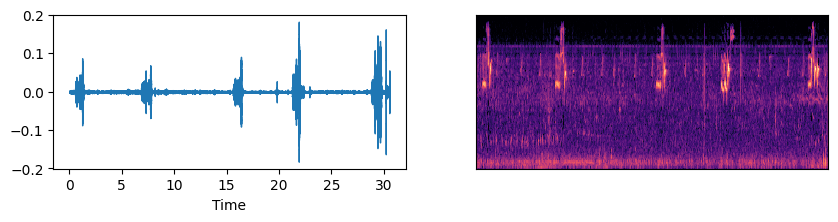

In [97]:
eff_error_path = paths[2][0]
wav, sr = librosa.load(eff_error_path.replace('.pt', '.ogg'))
spec = librosa.feature.melspectrogram(y=wav, sr=CFG.sample_rate, 
                                n_mels=CFG.img_size[0],
                                n_fft=CFG.nfft,
                                hop_length=CFG.hop_length,
                                fmax=CFG.fmax,
                                fmin=CFG.fmin,
                                )
spec = librosa.power_to_db(spec, ref=np.max)
fig, axs = plt.subplots(1, 2, figsize=(10, 2))
lid.waveshow(wav, sr=CFG.sample_rate, ax=axs[0])
lid.specshow(spec, sr=CFG.sample_rate, ax=axs[1])
display(ipd.Audio(wav, rate=CFG.sample_rate))

The noise in this segment is minimal compared with the previous two segments, but the efficientnet is also incorrectly predicted, indicating that the robustness of the efficientnet differs significantly from the ast model

 At the same time, we can see that the audio of birds is quite different from the traditional human audio. Their calls have certain regularity, but the difference between different birds' calls may be smaller, and it is difficult to reflect such small differences in the extracted features.